<a href="https://colab.research.google.com/github/DABallentine/knowledge_discovery_charlotte/blob/main/Charlotte_MAPS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Charlotte 311 Service Request Analysis

<h1> <b> Exploring Charlotte Shape Files </b> </h1>

## Data Import and Survey

In [1]:
# Import necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.style.use('ggplot')

In [2]:
# Function to read data from URL
def read_data_from_URL(url):
    df=pd.read_csv(url)
    return df

In [3]:
# mount and connect my drive to access shape files 

from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
# IMPORT Requests
requests = pd.read_csv('/content/gdrive/MyDrive/Charlotte 311 Calls Project/Data/Service_Requests_311.csv')

In [5]:
# Read in the data
# serv_req_url='https://bitbucket.org/nthammad-uncc/test_repo/raw/7508681846896228bb87fd1989ec50ca2d592bc5/data/Service_Requests_311.csv'
# requests = read_data_from_URL(serv_req_url)

## Initial Variable Selection


<b> The following variables will be dropped: </b>
<ol>
<li> X - redundant with X_COORD </li>
<li> Y - redundant with Y_COORD </li>
<li> FISCAL YEAR - redundant with RECEIVED_DATE </li>
<li> FISCAL MONTH - redundant with RECEIVED_DATE </li>
<li> TITLE - redundant with REQUEST_TYPE </li>
<li> CMPD_DIVISION - too many missing values </li>
<li> STREET_DIRECTION - redundant </li>
<li> STREET_NAME - redundant </li>
<li> STREET_TYPE - redundant </li>
<li> CITY - redundant </li>
<li> STATE - redundant </li>
<li> COUNCIL_DISTRICT - too many missing values </li>
<li> GLOBAL_ID - no predictive value </li>
<li> PID - no predictive value </li>
<li> SHAPE - all missing </li>
</ol>

In [6]:
requests.drop(requests.iloc[:, [0,1,4,6,7,11,12,15,16,17,18,19,26,27,28,29]], axis=1, inplace=True)
requests.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1631510 entries, 0 to 1631509
Data columns (total 14 columns):
 #   Column                      Non-Null Count    Dtype  
---  ------                      --------------    -----  
 0   OBJECTID                    1631510 non-null  int64  
 1   DEPARTMENT                  1631510 non-null  object 
 2   REQUEST_NO                  1631510 non-null  int64  
 3   REQUEST_TYPE                1631510 non-null  object 
 4   RECEIVED_DATE               1631510 non-null  object 
 5   INTERNAL_FIELD_OBSERVATION  1631510 non-null  object 
 6   NEIGHBORHOOD_PROFILE_AREA   1559062 non-null  float64
 7   BLOCK_NO                    1587157 non-null  float64
 8   ZIP_CODE                    1586427 non-null  float64
 9   FULL_ADDRESS                1624342 non-null  object 
 10  X_COORD                     1559084 non-null  float64
 11  Y_COORD                     1559084 non-null  float64
 12  LATITUDE                    1559077 non-null  float64
 1

In [7]:
# Drop all records which are missing addresses or LATITUDE and LONGITUDE
print('Size before dropping records:', requests.shape)
start_size = requests.shape[0]
requests = requests[~requests['FULL_ADDRESS'].isnull() & 
                    ~requests['ZIP_CODE'].isnull() &
                    ~requests['LATITUDE'].isnull() & 
                    ~requests['LONGITUDE'].isnull() &
                    ~requests['NEIGHBORHOOD_PROFILE_AREA'].isnull()]
num_nulls = start_size - requests.shape[0]
print('Size after dropping {dropped} records:'.format(dropped = num_nulls), requests.shape)

Size before dropping records: (1631510, 14)
Size after dropping 99185 records: (1532325, 14)


In [8]:
# Divide categories by season of the year
requests['RECEIVED_DATE'] = pd.to_datetime(requests['RECEIVED_DATE'], format='%Y/%m/%d %H:%M')
requests['SEASON'] = requests['RECEIVED_DATE'].dt.quarter

# Create new columns in the requests dataset for month and year
requests['RECEIVED_MONTH']= pd.to_datetime(requests['RECEIVED_DATE']).dt.month
requests['RECEIVED_YEAR']= pd.to_datetime(requests['RECEIVED_DATE']).dt.year

In [9]:
requests.isna().sum()

OBJECTID                      0
DEPARTMENT                    0
REQUEST_NO                    0
REQUEST_TYPE                  0
RECEIVED_DATE                 0
INTERNAL_FIELD_OBSERVATION    0
NEIGHBORHOOD_PROFILE_AREA     0
BLOCK_NO                      0
ZIP_CODE                      0
FULL_ADDRESS                  0
X_COORD                       0
Y_COORD                       0
LATITUDE                      0
LONGITUDE                     0
SEASON                        0
RECEIVED_MONTH                0
RECEIVED_YEAR                 0
dtype: int64

# Mapping GeoData

In [10]:
# to read and visualize spatial data
! pip install geopandas
import geopandas as gpd

! pip install contextily
import contextily as ctx

! pip install descartes
import descartes

     |████████████████████████████████| 1.0 MB 14.7 MB/s 
     |████████████████████████████████| 6.3 MB 32.2 MB/s 
     |████████████████████████████████| 15.4 MB 65.3 MB/s 
     |████████████████████████████████| 19.3 MB 399 kB/s 


# Covert our Data File to a Geopandas Dataframe

In [11]:
# Covert our merged_requests_df dataframe into a Geopandas Dataframe
# We will set a Coordinate reference systems (CRS) using Longitude and Latitude in our 311 data set

geo_requests = gpd.GeoDataFrame(requests, 
                                crs = 'EPSG:4326',
                                geometry = gpd.points_from_xy(requests.LONGITUDE, 
                                                              requests.LATITUDE))



In [12]:
# Confirm reproject to CRS = EPSG 4326 (Map with Long/Lat)
geo_requests = geo_requests.to_crs(epsg=4326)



In [13]:
# convert lat/lon to floats
geo_requests.LONGITUDE = geo_requests.LONGITUDE.astype('float')
geo_requests.LATITUDE = geo_requests.LATITUDE.astype('float')



In [14]:
# drop the unmapped rows - anything that has a longitude of 0 should be removed
geo_requests = geo_requests[geo_requests.LONGITUDE!=0]
geo_requests = geo_requests[geo_requests.LATITUDE!=0]



In [15]:
# Check for missing values
geo_requests.isna().sum()

OBJECTID                      0
DEPARTMENT                    0
REQUEST_NO                    0
REQUEST_TYPE                  0
RECEIVED_DATE                 0
INTERNAL_FIELD_OBSERVATION    0
NEIGHBORHOOD_PROFILE_AREA     0
BLOCK_NO                      0
ZIP_CODE                      0
FULL_ADDRESS                  0
X_COORD                       0
Y_COORD                       0
LATITUDE                      0
LONGITUDE                     0
SEASON                        0
RECEIVED_MONTH                0
RECEIVED_YEAR                 0
geometry                      0
dtype: int64

In [16]:
geo_requests.head()

,OBJECTID,DEPARTMENT,REQUEST_NO,REQUEST_TYPE,RECEIVED_DATE,INTERNAL_FIELD_OBSERVATION,NEIGHBORHOOD_PROFILE_AREA,BLOCK_NO,ZIP_CODE,FULL_ADDRESS,X_COORD,Y_COORD,LATITUDE,LONGITUDE,SEASON,RECEIVED_MONTH,RECEIVED_YEAR,geometry
0,1,Solid Waste Services,6402056,NON_RECYCLABLE ITEMS,2016-11-07 14:25:00+00:00,N,215.0,3601.0,28226.0,"3601 KNAPDALE LN, CHARLOTTE, NC 28226",1458251.0,508075.0,35.132444,-80.812089,4,11,2016,POINT (-80.81209 35.13244)
1,2,Housing and NBHD Serv,6402064,UTILITY VERIFICATION LTR,2016-11-07 14:28:00+00:00,N,265.0,4124.0,28269.0,"4124 SILVERMERE WY, CHARLOTTE, NC 28269",1468687.0,587226.0,35.350408,-80.781941,4,11,2016,POINT (-80.78194 35.35041)
2,3,Solid Waste Services,6402082,NON_RECYCLABLE ITEMS,2016-11-07 14:34:00+00:00,N,103.0,523.0,28213.0,"523 GRAHAM MEADOW DR, CHARLOTTE, NC 28213",1471481.0,562513.0,35.282654,-80.771094,4,11,2016,POINT (-80.77109 35.28265)
3,4,Solid Waste Services,6402103,MISSED RECYCLING,2016-11-07 14:41:00+00:00,N,158.0,1801.0,28216.0,"1801 CRANDON DR, CHARLOTTE, NC 28216",1438992.0,568604.0,35.297745,-80.880327,4,11,2016,POINT (-80.88033 35.29775)
5,6,Finance/City,6402112,CWP REQUEST,2016-11-07 14:45:00+00:00,N,88.0,309.0,28208.0,"309 JONES ST APT 1, CHARLOTTE, NC 28208",1439454.0,552715.0,35.254120,-80.877772,4,11,2016,POINT (-80.87777 35.25412)


In [17]:
# get the bounding box coordinates for the 311 calls data
minx, miny, maxx, maxy = geo_requests.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)





-85.56829116
-80.55847037
35.01303165
35.51069535


In [18]:

# mount and connect my drive to access shape files 

from google.colab import drive
drive.mount('/content/gdrive')



Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Shape File: Neighborhood Profile Areas

In [31]:
# IMPORT SHAPE FILE FOR MAPPING
npa_map = gpd.read_file('/content/gdrive/MyDrive/Charlotte 311 Calls Project/Data/NPA/npa.shp')

In [32]:
# Layers into a web mercator projection
# reproject to web mercator
npa_map = npa_map.to_crs(epsg=4326)

In [33]:
npa_map.head()

,objectid_1,id,npa,neighborho,completion,issue_year,shape_Leng,shape_Area,geometry
0,1,252.0,252.0,0,None,None,14437.938815,1.075002e+07,"POLYGON ((-80.79190 35.34936, -80.79179 35.349..."
1,4,306.0,306.0,0,None,None,24370.202577,2.965257e+07,"POLYGON ((-80.93360 35.19694, -80.93346 35.196..."
2,102,135.0,135.0,0,None,None,9816.557207,6.150733e+06,"POLYGON ((-80.75109 35.20038, -80.75093 35.201..."
3,2,449.0,449.0,0,None,None,46853.044256,1.078322e+08,"POLYGON ((-80.90249 35.45644, -80.90289 35.456..."
4,3,137.0,137.0,0,None,None,34092.117981,3.199373e+07,"POLYGON ((-80.90389 35.28395, -80.90387 35.283..."


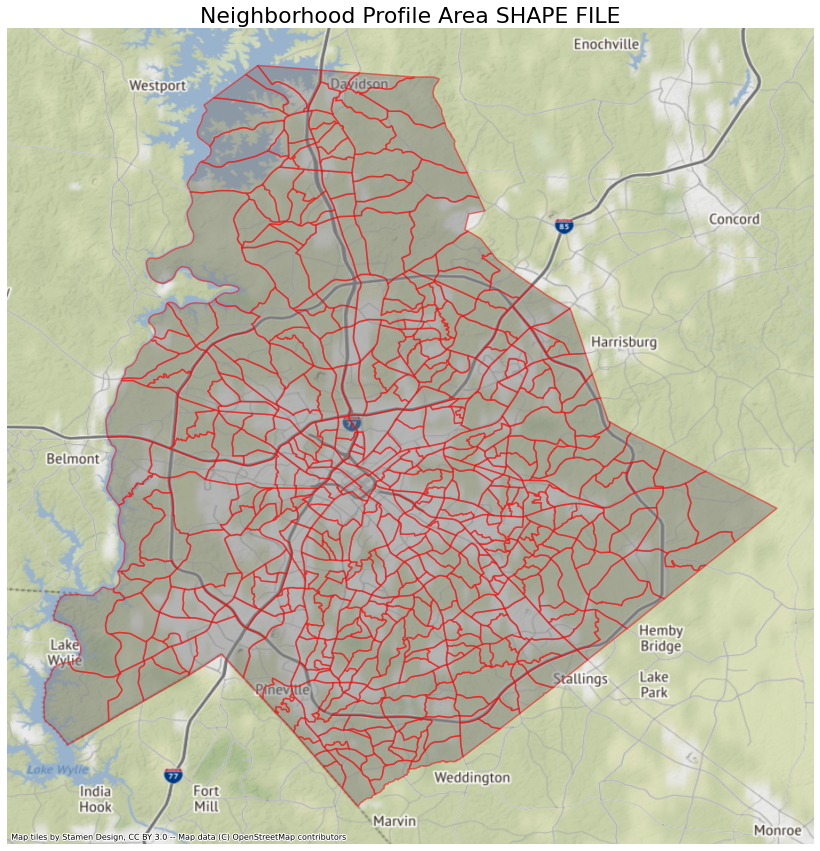

In [34]:
# Checking out what a plot looks like
fig, ax = plt.subplots(figsize=(15,15))

npa_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='red',
                            lw=1.5,
                            alpha=0.5)

# no axis
ax.axis('off')
ax.set_title('Neighborhood Profile Area SHAPE FILE',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = npa_map.crs.to_string())

In [35]:
# SET UP SOMETHING TO FILTER BY FOR AN OVERLAY PLOT

# How to filter on 2 conditions
# df.loc[(df['Salary_in_1000']>=100) & (df['Age']< 60) & (df['FT_Team'].str.startswith('S')),['Name','FT_Team']]



# 311 Service Recycle requests plotted over various time scales

recy_year_2016 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2016) & (geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]

recy_year_2017 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2017) & (geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]

recy_year_2018 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2018) & (geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]

recy_year_2019 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2019) & (geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]

recy_year_2020 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2020) & (geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]

recy_year_2021 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2021) & (geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]

recy_year_all = geo_requests.loc[(geo_requests['REQUEST_TYPE'] == 'RECYCLABLE ITEMS')]


# 311 Service Recycle requests plotted over various time scales

non_recy_year_2016 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2016) & (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]

non_recy_year_2017 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2017) & (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]

non_recy_year_2018 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2018) & (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]

non_recy_year_2019 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2019) & (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]

non_recy_year_2020 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2020) & (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]

non_recy_year_2021 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2021) & (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]

non_recy_year_all = geo_requests.loc[(geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS')]



# Block Group Confirmation

bgconf = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2021) 
& (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS') 
& (geo_requests['NEIGHBORHOOD_PROFILE_AREA'] == 384.0)]

bgconf2 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2021) 
& (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS') 
& (geo_requests['NEIGHBORHOOD_PROFILE_AREA'] == 371.0)]

bgconf3 = geo_requests.loc[(geo_requests['RECEIVED_YEAR'] == 2021) 
& (geo_requests['REQUEST_TYPE'] == 'NON_RECYCLABLE ITEMS') 
& (geo_requests['NEIGHBORHOOD_PROFILE_AREA'] == 372.0)]





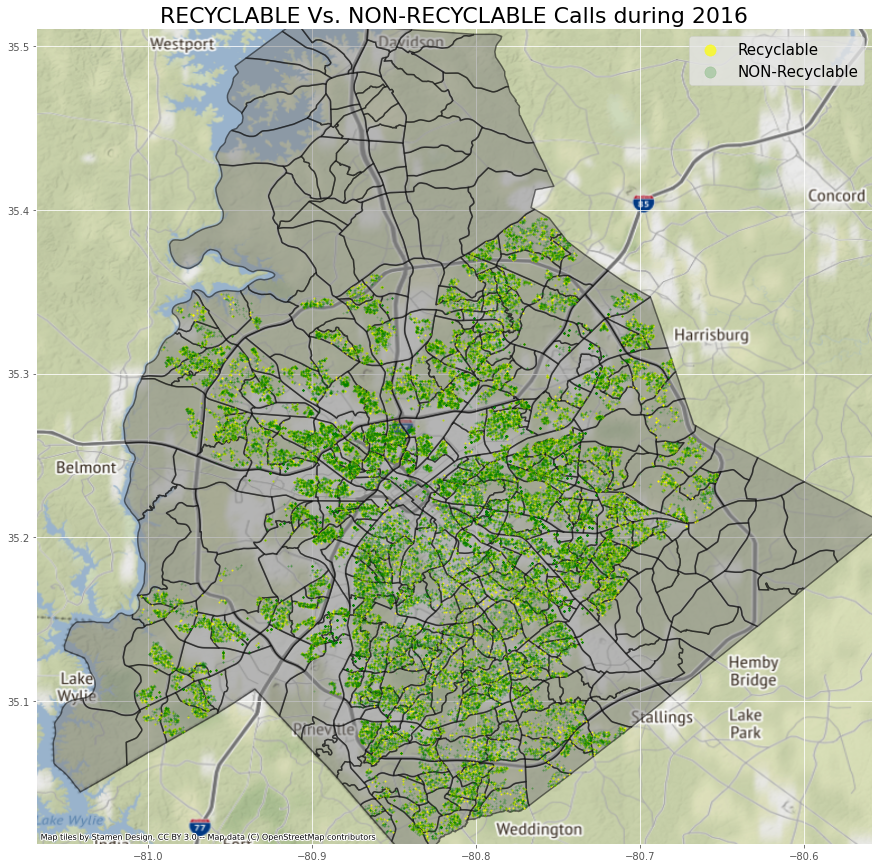

In [40]:
# Layering 2016 Recycle & Non Recycle requests onto the NPA Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
npa_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='black',
                            lw=1.5,
                            alpha=0.5,
                            aspect=1)


# Plot 2 - Map all 2016 Recycle 311-Calls
recy_year_2016.plot(ax=ax, 
                    color='yellow',
                    markersize=2,
                    alpha=0.7,
                    aspect = 1,
                    label = 'Recyclable')


# Plot 3 - Map all 2016 Non-Recycle 311-Calls
non_recy_year_2016.plot(ax=ax, 
                        color='green',
                        markersize=2,
                        alpha=0.2,
                        aspect = 1,
                        label = 'NON-Recyclable')


plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)


# no axis
# ax.axis('off')
ax.set_title('RECYCLABLE Vs. NON-RECYCLABLE Calls during 2016',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = npa_map.crs.to_string())

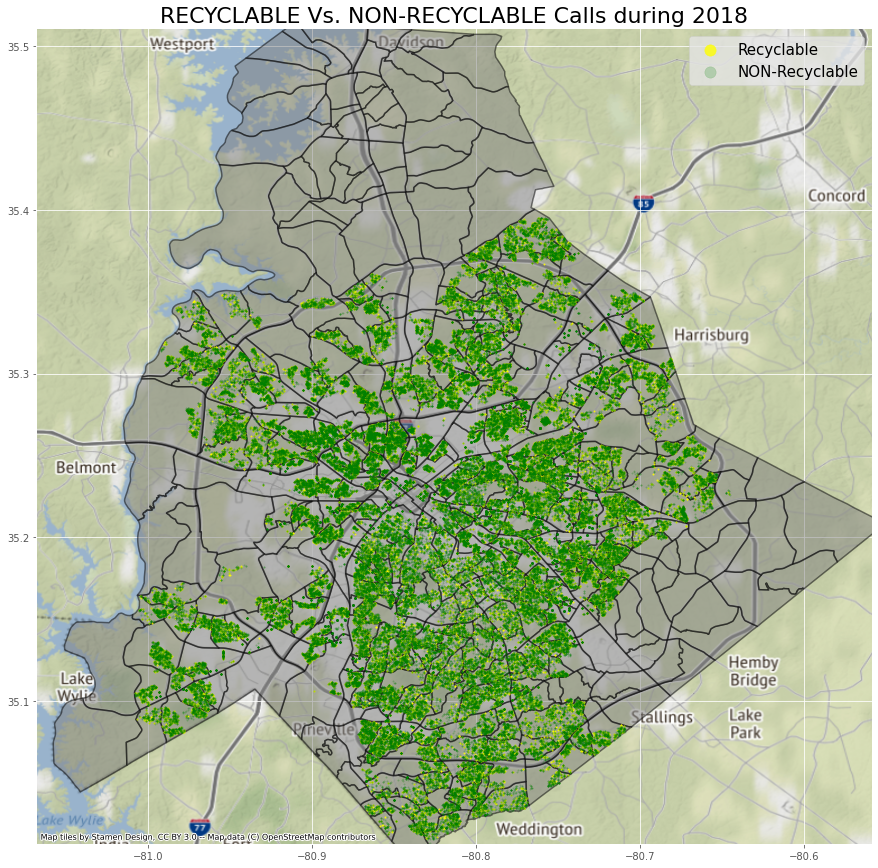

In [41]:
# Layering 2018 Recycle & Non Recycle requests onto the NPA Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
npa_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='black',
                            lw=1.5,
                            alpha=0.5,
                            aspect=1)


# Plot 2 - Map all 2018 Recycle 311-Calls
recy_year_2018.plot(ax=ax, 
                    color='yellow',
                    markersize=2,
                    alpha=0.8,
                    aspect = 1,
                    label = 'Recyclable')


# Plot 3 - Map all 2018 Non-Recycle 311-Calls
non_recy_year_2018.plot(ax=ax, 
                        color='green',
                        markersize=2,
                        alpha=0.2,
                        aspect = 1,
                        label = 'NON-Recyclable')


plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)


# no axis
# ax.axis('off')
ax.set_title('RECYCLABLE Vs. NON-RECYCLABLE Calls during 2018',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = npa_map.crs.to_string())

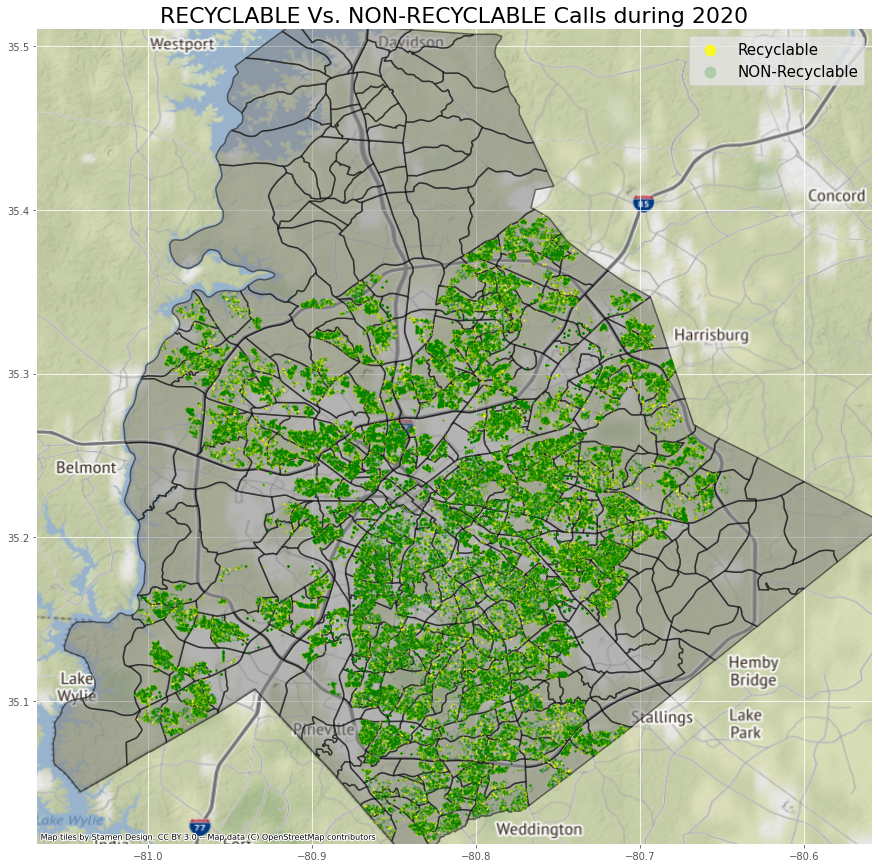

In [42]:
# Layering 2020 Recycle & Non Recycle requests onto the NPA Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
npa_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='black',
                            lw=1.5,
                            alpha=0.5,
                            aspect=1)


# Plot 2 - Map all 2020 Recycle 311-Calls
recy_year_2020.plot(ax=ax, 
                    color='yellow',
                    markersize=2,
                    alpha=0.8,
                    aspect = 1,
                    label = 'Recyclable')


# Plot 3 - Map all 2020 Non-Recycle 311-Calls
non_recy_year_2020.plot(ax=ax, 
                        color='green',
                        markersize=2,
                        alpha=0.2,
                        aspect = 1,
                        label = 'NON-Recyclable')


plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)


# no axis
# ax.axis('off')
ax.set_title('RECYCLABLE Vs. NON-RECYCLABLE Calls during 2020',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = npa_map.crs.to_string())

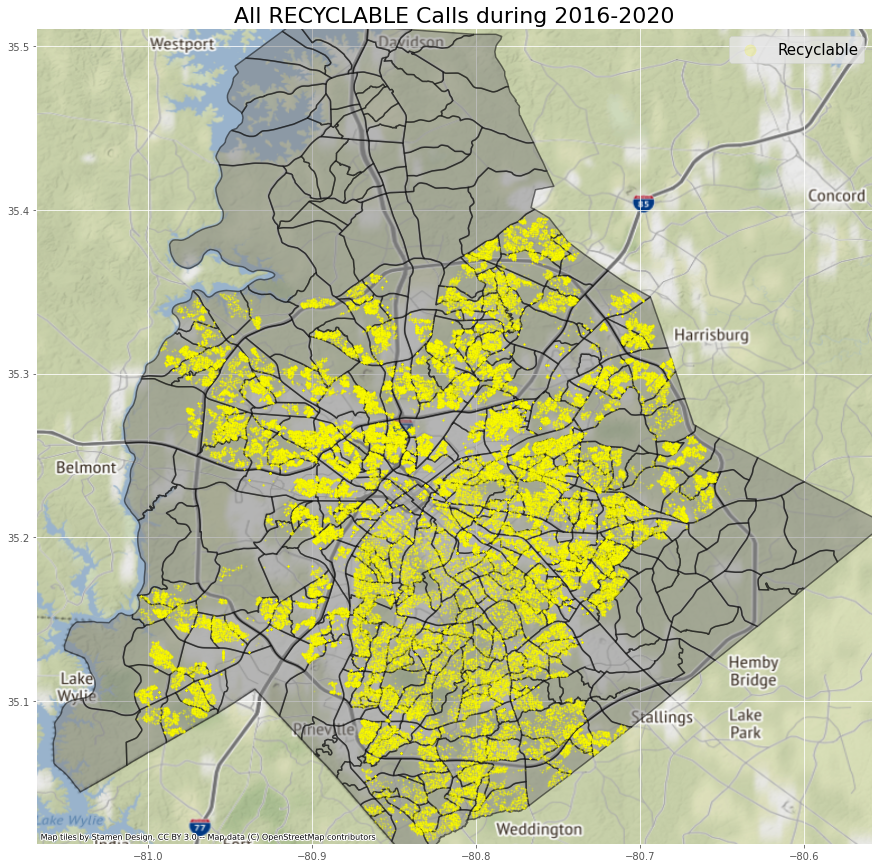

In [43]:
# Layering ALL Recycle requests onto the NPA Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
npa_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='black',
                            lw=1.5,
                            alpha=0.5,
                            aspect=1)


# Plot 2 - Map all Recycle 311-Calls
recy_year_all.plot(ax=ax, 
                    color='yellow',
                    markersize=2,
                    alpha=0.2,
                    aspect = 1,
                    label = 'Recyclable')


plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)


# no axis
# ax.axis('off')
ax.set_title('All RECYCLABLE Calls during 2016-2020',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = npa_map.crs.to_string())

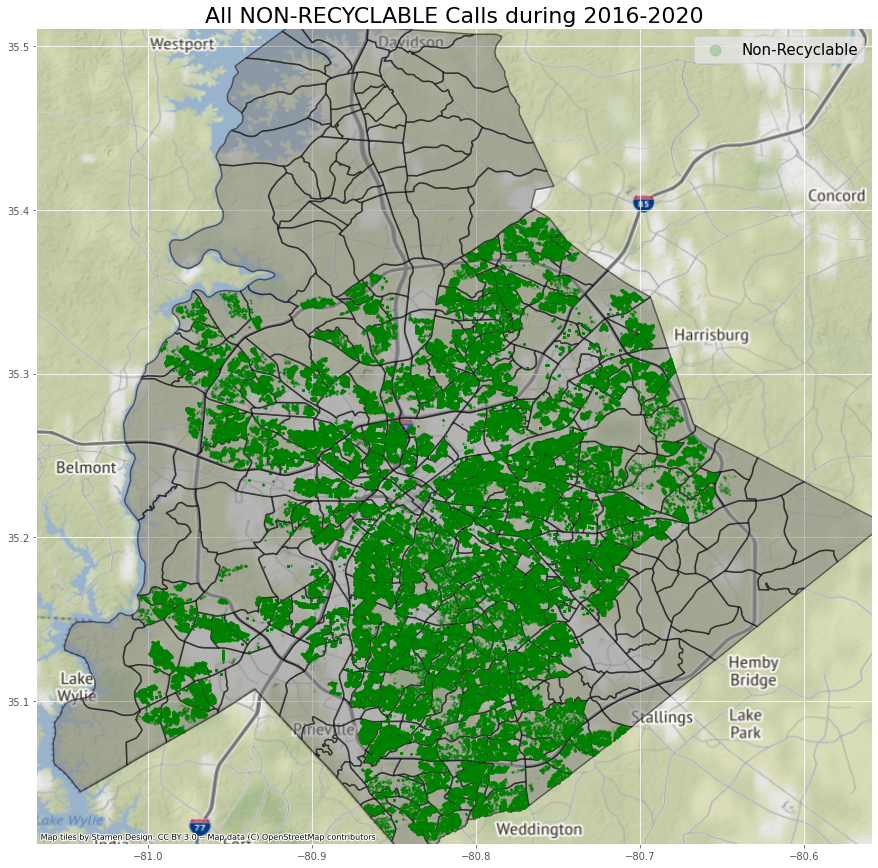

In [52]:
# Layering All Non-Recy requests onto the NPA Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
npa_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='black',
                            lw=1.5,
                            alpha=0.5,
                            aspect=1)


# Plot 2 - Map all NON Recycle 311-Calls
non_recy_year_all.plot(ax=ax, 
                    color='green',
                    markersize=2,
                    alpha=0.2,
                    aspect = 1,
                    label = 'Non-Recyclable')


plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)


# no axis
# ax.axis('off')
ax.set_title('All NON-RECYCLABLE Calls during 2016-2020',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = npa_map.crs.to_string())

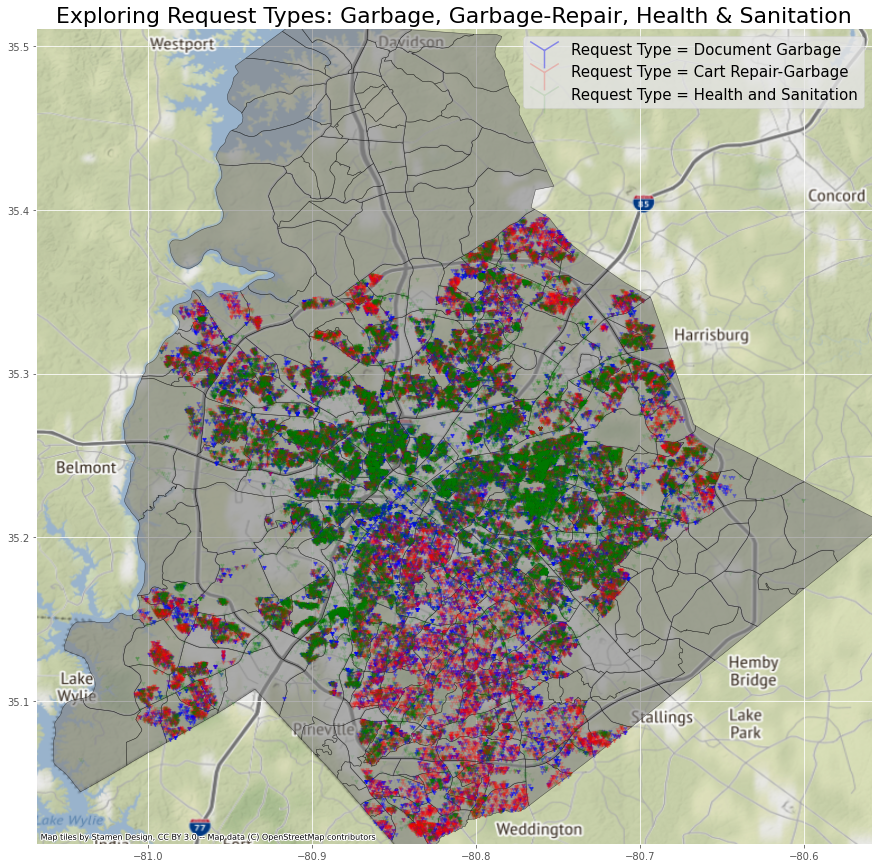

In [46]:
fig,ax = plt.subplots(figsize = (15,15))

npa_map.plot(ax= ax, 
                           color='grey', 
                           edgecolor='black', 
                           alpha =0.6, 
                           lw=0.5)
        
# Plot 1
geo_requests[geo_requests['REQUEST_TYPE'] == 'SW DOCUMENT GARBAGE'].plot(ax = ax, 
                                                                         markersize = 20, 
                                                                         color = 'blue', 
                                                                         marker = '1', 
                                                                         label = 'Request Type = Document Garbage', 
                                                                         alpha =0.4, 
                                                                         aspect=1)


# Plot 2
geo_requests[geo_requests['REQUEST_TYPE'] == 'CART REPAIR-GARBAGE'].plot(ax = ax, 
                                                                         markersize = 20, 
                                                                         color = 'red', 
                                                                         marker = '1', 
                                                                         label = 'Request Type = Cart Repair-Garbage', 
                                                                         alpha =0.2, 
                                                                         aspect=1)

# Plot 3
geo_requests[geo_requests['REQUEST_TYPE'] == 'HNS HEALTH AND SANITATION'].plot(ax = ax, 
                                                                               markersize = 20, 
                                                                               color = 'green', 
                                                                               marker = '1', 
                                                                               label = 'Request Type = Health and Sanitation', 
                                                                               alpha =0.1, 
                                                                               aspect=1)


plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)

ax.set_title('Exploring Request Types: Garbage, Garbage-Repair, Health & Sanitation',fontsize=22)

#adds in the highway background 
ctx.add_basemap(ax, crs=npa_map.crs.to_string())

# Naomi's Association Rule map

In [47]:
# Plot Variable Names

npa3 = geo_requests.loc[(geo_requests['NEIGHBORHOOD_PROFILE_AREA'] == 3)]

npa371 = geo_requests.loc[(geo_requests['NEIGHBORHOOD_PROFILE_AREA'] == 371)]

npa378 = geo_requests.loc[(geo_requests['NEIGHBORHOOD_PROFILE_AREA'] == 378)]

npa392 = geo_requests.loc[(geo_requests['NEIGHBORHOOD_PROFILE_AREA'] == 392)]

npa393 = geo_requests.loc[(geo_requests['NEIGHBORHOOD_PROFILE_AREA'] == 393)]

npa385 = geo_requests.loc[(geo_requests['NEIGHBORHOOD_PROFILE_AREA'] == 385)]

In [53]:
npa393.head()

,OBJECTID,DEPARTMENT,REQUEST_NO,REQUEST_TYPE,RECEIVED_DATE,INTERNAL_FIELD_OBSERVATION,NEIGHBORHOOD_PROFILE_AREA,BLOCK_NO,ZIP_CODE,FULL_ADDRESS,X_COORD,Y_COORD,LATITUDE,LONGITUDE,SEASON,RECEIVED_MONTH,RECEIVED_YEAR,geometry
31,32,Solid Waste Services,6656417,NON_RECYCLABLE ITEMS,2017-07-12 15:11:00+00:00,N,393.0,914.0,28210.0,"914 CAMBORNE PL, CHARLOTTE, NC 28210",1441501.0,516951.0,35.155975,-80.868661,3,7,2017,POINT (-80.86866 35.15598)
60,61,Solid Waste Services,6710396,NON_RECYCLABLE ITEMS,2017-08-27 21:24:04+00:00,N,393.0,5533.0,28210.0,"5533 MURRAYHILL RD, CHARLOTTE, NC 28210",1444094.0,521260.0,35.167947,-80.860258,3,8,2017,POINT (-80.86026 35.16795)
243,244,Solid Waste Services,6656678,NON_RECYCLABLE ITEMS,2017-07-12 16:59:00+00:00,N,393.0,1926.0,28210.0,"1926 TYVOLA RD, CHARLOTTE, NC 28210-704",1442396.0,519018.0,35.161700,-80.865798,3,7,2017,POINT (-80.86580 35.16170)
262,263,Solid Waste Services,6448165,NON_RECYCLABLE ITEMS,2017-01-04 01:47:46+00:00,N,393.0,5112.0,28210.0,"5112 GRICE CT, CHARLOTTE, NC 28210",1439841.0,522474.0,35.171062,-80.874563,1,1,2017,POINT (-80.87456 35.17106)
415,416,Solid Waste Services,6448409,RECYCLABLE ITEMS,2017-01-04 14:13:00+00:00,N,393.0,5544.0,28210.0,"5544 WEDGEWOOD DR, CHARLOTTE, NC 28210",1444146.0,521537.0,35.168710,-80.860101,1,1,2017,POINT (-80.86010 35.16871)


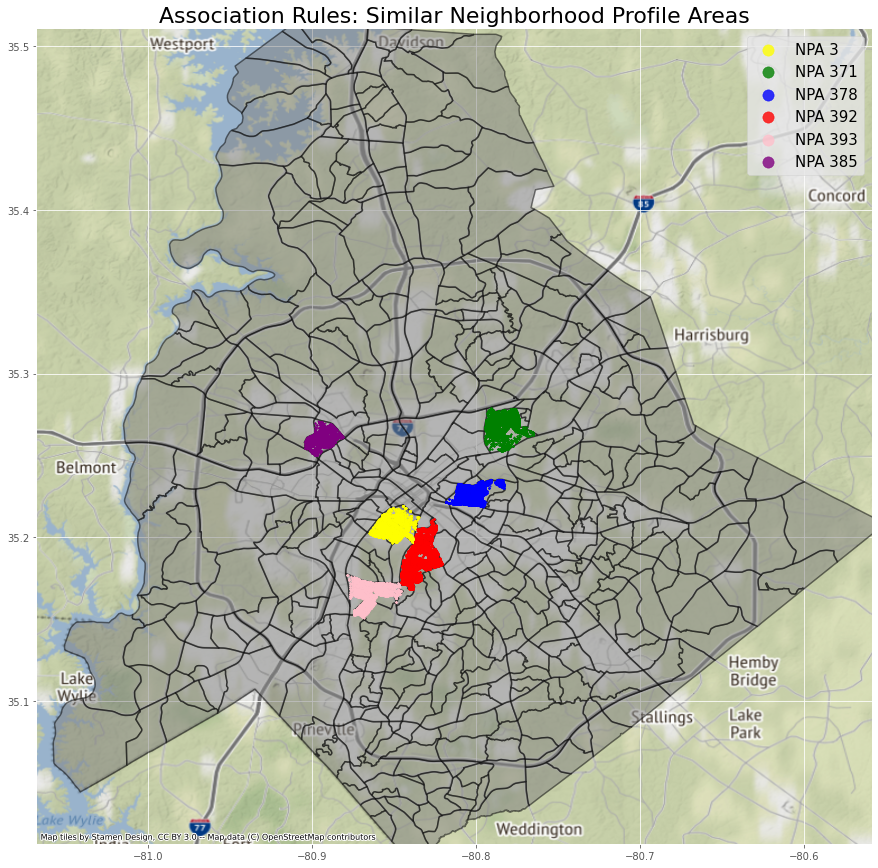

In [54]:
# Naomi's map
# Layering All Recy & Non-Recy requests onto the NPA Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
npa_map.plot(ax=ax,
                            color='grey', 
                            edgecolor='black',
                            lw=1.5,
                            alpha=0.5,
                            aspect=1)


# Plot 2 - NPA = 3
npa3.plot(ax=ax, 
                    color='yellow',
                    markersize=2,
                    alpha=0.8,
                    aspect = 1,
                    label = 'NPA 3')

# Plot 3 - NPA = 371
npa371.plot(ax=ax, 
                    color='green',
                    markersize=2,
                    alpha=0.8,
                    aspect = 1,
                    label = 'NPA 371')

# Plot 4 - NPA = 371
npa378.plot(ax=ax, 
                    color='blue',
                    markersize=2,
                    alpha=0.8,
                    aspect = 1,
                    label = 'NPA 378')

# Plot 5 - NPA = 392
npa392.plot(ax=ax, 
                    color='red',
                    markersize=2,
                    alpha=0.8,
                    aspect = 1,
                    label = 'NPA 392')

# Plot 6 - NPA = 392
npa393.plot(ax=ax, 
                    color='pink',
                    markersize=2,
                    alpha=0.8,
                    aspect = 1,
                    label = 'NPA 393')

# Plot 7 - NPA = 385
npa385.plot(ax=ax, 
                    color='purple',
                    markersize=2,
                    alpha=0.8,
                    aspect = 1,
                    label = 'NPA 385')



plt.legend(markerscale = 8,
           prop={'size': 15})

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx + 4.5, maxx) 
ax.set_ylim(miny, maxy)


# no axis
# ax.axis('off')
ax.set_title('Association Rules: Similar Neighborhood Profile Areas',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs = npa_map.crs.to_string())

<h2> Data Preprocessing </h2>

<h2> Data Understanding and Exploration </h2>

<h2> Data Preparation for Modeling </h2>

<h2> Modeling </h2>

<h2> Evaluation </h2>

<h2> Results </h2>